In [1]:
'''
Date: 14/June/2022
Auther: Yike Xie
Content: Figure 1 in dengue paper
'''

'\nDate: 14/June/2022\nAuther: Yike Xie\nContent: Figure 1 in dengue paper\n'

In [2]:
import os

import numpy as np
import pandas as pd

import anndata
import scanpy as sc

import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
from matplotlib.collections import PatchCollection
from matplotlib import gridspec
import matplotlib as mpl
import seaborn as sns

from collections import defaultdict
import random
import itertools
from numpy import *    

In [3]:
import sys
sys.path.append('/home/yike/phd/dengue/dengue_children/paper_figures/final/modules/') 
import YK_util, optimized_pair_comparison, functions_CCC_figure_fra_pair
from YK_util import *
from optimized_pair_comparison import *
from functions_CCC_figure_fra_pair import *

In [4]:
# load data
path = '/home/yike/phd/dengue/data/mergedata_luca_NKT_202206.h5ad'
adata = sc.read_h5ad(path)

adata_kid = subsetdata(adata)
adata_kid = normalizedata(adata_kid, log1p=True) # log1p = 2
adata_kid = removegenes(adata_kid)
adata_kid = adata_kid[(adata_kid.obs.cell_subtype_new != 'doublets') & 
                        (adata_kid.obs.cell_subtype_new != 'unknown')].copy()

sc.pp.filter_genes(adata_kid, min_cells=3)

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


In [5]:
#reorder some celltypes
reorg_data(adata_kid)

/home/yike/phd/dengue/dengue_children/paper_figures/final/modules/YK_util.py:172: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['cell_type_new'].cat.reorder_categories(group_order_primary, inplace=True)
/home/yike/phd/dengue/dengue_children/paper_figures/final/modules/YK_util.py:204: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['cell_subtype_new'].cat.reorder_categories(group_order_secondary, inplace=True)


In [6]:
#clustering
cluster (adata_kid)

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


In [7]:
# X_umap = np.loadtxt('/home/yike/phd/dengue/dengue_children/paper_figures/final/references/Zhiyuan_refs/X_umap.txt')
# adata_kid.obsm['X_umap'] = X_umap
# adata_kid.write('/home/yike/phd/dengue/data/mergedata_20211001_kid_umap.h5ad')

In [25]:
#save path
save_figures = '/home/yike/phd/dengue/docs/paper_draft/figures/figure_1/'
save_tables = '/home/yike/phd/dengue/docs/paper_draft/tabels/'

In [26]:
# get cell types and cell subtypes
cell_types = adata_kid.obs['cell_type_new'].cat.categories.tolist()
cell_subtypes = adata_kid.obs['cell_subtype_new'].cat.categories.tolist()

In [18]:
# load cell type palette
ct_palette = load_ct_palette()
print([ct for ct in ct_palette.keys()])
sns.color_palette(ct_palette.values())

['B cells', 'Plasmablasts', 'T cells', 'NK cells', 'Monocytes', 'conventional DCs', 'plasmacytoid DCs', 'megakaryocytes']


[(0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451)]

In [19]:
# load cell subtype palette
cst_palette = load_cst_palette()
print([cst for cst in cst_palette.keys()])
sns.color_palette(list(cst_palette.values())[:10])

['memory B cells', 'naive B cells', 'activated B cells', 'proliferating plasmablasts', 'non-proliferating plasmablasts', 'CD4+ naive T cells', 'CD4+ memory T cells', 'CD8+ naive T cells', 'CD8+ effector memory T cells', 'CD8+ exhausted T cells', 'Tregs', 'MAIT', 'signaling NK cells', 'cytotoxic NK cells', 'proliferating NK cells', 'classical monocytes', 'non-classical monocytes', 'intermediate monocytes', 'cDC1', 'cDC2', 'pDCs', 'megakaryocytes']


[(1.0, 0.0, 0.0),
 (0.7372549019607844, 0.5607843137254902, 0.5607843137254902),
 (0.5019607843137255, 0.0, 0.0),
 (1.0, 0.8941176470588236, 0.7686274509803922),
 (1.0, 0.5490196078431373, 0.0),
 (0.6901960784313725, 0.7686274509803922, 0.8705882352941177),
 (0.4392156862745098, 0.5019607843137255, 0.5647058823529412),
 (0.0, 0.0, 0.5019607843137255),
 (0.2549019607843137, 0.4117647058823529, 0.8823529411764706),
 (0.0, 0.7490196078431373, 1.0)]

In [41]:
sns.color_palette(list(cst_palette.values())[10:])

[(0.0, 1.0, 1.0),
 (0.37254901960784315, 0.6196078431372549, 0.6274509803921569),
 (0.5019607843137255, 0.0, 0.5019607843137255),
 (0.8666666666666667, 0.6274509803921569, 0.8666666666666667),
 (1.0, 0.0, 1.0),
 (0.5607843137254902, 0.7372549019607844, 0.5607843137254902),
 (0.5647058823529412, 0.9333333333333333, 0.5647058823529412),
 (0.0, 0.5019607843137255, 0.0),
 (1.0, 0.7529411764705882, 0.796078431372549),
 (1.0, 0.0784313725490196, 0.5764705882352941),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451)]

In [21]:
def umap_plot(adata, path, group, color_map, title, filetype=False, annotation=False, **kwargs):
    rcParams['figure.figsize']=(7,7)
    rcParams['font.size']= 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"
    
    temp = adata[(adata.obs[group] != 'unknown') & (adata.obs[group] != 'doublets')].copy()
    
    fig, ax = plt.subplots()
    if annotation == False:
        sc.pl.umap(temp, color=group, palette = color_map, ax=ax, show=False, title = title, size=20, **kwargs)
        ax.legend(markerscale = 3, fontsize = 16, bbox_to_anchor=(1, 1), frameon = False)
    elif annotation == True:
        temp.obs['umap'] = temp.obs[group]
        ct_rep = {'B cells': 'B',
                  'Plasmablasts': 'Plasmablasts',
                  'T cells': 'T',
                  'NK cells': 'NK',
                  'Monocytes': 'Monocytes',
                  'conventional DCs': 'cDCs',
                  'plasmacytoid DCs': 'pDCs',
                  'megakaryocytes': 'mega'}
        cst_rep = {cst: str(n + 1) for cst, n in zip(cell_subtypes, range(len(cell_subtypes)))}
        temp.obs['umap'].replace([ct_rep, st_rep][group != 'cell_type_new'], inplace=True)
        
        reorder_list = [[ct_rep[ct] for ct in cell_types], [cst_rep[cst] for cst in cell_subtypes]]
        temp.obs.umap = temp.obs.umap.astype('category')
        temp.obs.umap.cat.reorder_categories(reorder_list[group != 'cell_type_new'], 
            inplace = True)

        sc.pl.umap(temp, color='umap', palette = color_map, ax=ax, show=False, title = title, size=20,
                   legend_loc='on data', legend_fontweight = 'bold', **kwargs)
        
    if filetype is not False:
        name = 'umap_' + group +'.' + filetype
        fig.savefig(os.path.join(path, name), bbox_inches='tight')
        
    return {'xlim': ax.get_xlim(), 'ylim': ax.get_ylim()}

def umap_plot_2(adata, path, group, color_map, title, xlim, ylim, filetype=False):
    rcParams['figure.figsize']=(7,7)
    rcParams['font.size']= 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"

    temp = adata[(adata.obs[group] != 'unknown') & (adata.obs[group] != 'doublets')].copy()
    temp.obs['umap'] = temp.obs[group]
    cst_rep = {cst: str(n + 1) for cst, n in zip(cell_subtypes, range(len(cell_subtypes)))}
    temp.obs['umap'].replace(cst_rep, inplace=True)
        
    fig, ax = plt.subplots()
    sc.pl.umap(temp, color='umap', palette = color_map, ax=ax, show=False, title = title, size=5,
               legend_loc='on data', legend_fontweight = 'normal', legend_fontsize = 16)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    
    if filetype is not False:
        name = 'umap_' + group + '_' + title + '.' + filetype
        fig.savefig(os.path.join(path, name), bbox_inches='tight')
        
    
def dotplot(adata, path, marker_genes):
    rcParams['pdf.fonttype'] = 42
    rcParams['font.size'] = 18
    rcParams['figure.dpi'] = 300

    fig, ax = plt.subplots(figsize = (16, 9.5))
    axs = sc.pl.dotplot(adata_kid, marker_genes, groupby='cell_subtype_new', cmap = 'viridis', 
                      use_raw=False, show=False, ax=ax,
                      colorbar_title = 'Mean exp\n(cpm)',
                      size_title = 'Frac of cells\n(%)')

    lims = axs['color_legend_ax'].get_xlim()
    axs['color_legend_ax'].remove()

    norm = mpl.colors.Normalize(lims[0], lims[1])
    cmap = plt.cm.get_cmap('viridis')
    axs['color_legend_ax'] = fig.add_axes([0.82, 0.5, 0.1, 0.05])
    cbar = mpl.colorbar.ColorbarBase(axs['color_legend_ax'], norm=norm, cmap=cmap, orientation='horizontal')
    cbar.set_ticks([0, np.log2(10), np.log2(100), np.log2(1000), np.log2(10000)])
    cbar.set_ticklabels(['0', '$10$', '$10^2$', '$10^3$', '$10^4$'])
    cbar.ax.tick_params(labelsize=15)
    axs['color_legend_ax'].set_title('Mean exp\n(cpm)', fontsize=15)
    plt.show()
    
    fig.savefig(os.path.join(path, 'dotplot.png'), bbox_inches='tight')
    fig.savefig(os.path.join(path, 'dotplot.pdf'), bbox_inches='tight')
    
def umap_virus(adata, path, group, filetype=False, **kwargs):
    rcParams['figure.figsize']=(7,7)
    rcParams['font.size']= 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"
    
    temp = adata[(adata.obs[group] != 'unknown') & (adata.obs[group] != 'doublets')].copy()
    
    fig, ax = plt.subplots()
    axs = sc.pl.umap(adata, color=group, show=False, 
                   use_raw=False, size=20, ax=ax)
    fig = plt.gcf()
    ax_all = fig.get_axes()

    cbar_old = ax_all[-1]
    lims = cbar_old.get_xlim()
    cbar_old.remove()

    norm = mpl.colors.Normalize(lims[0], lims[1])
    cmap = plt.cm.get_cmap('viridis')
    ax_all.append(fig.add_axes([0.85, 0.3, 0.03, 0.4]))
    cbar = mpl.colorbar.ColorbarBase(ax_all[-1], norm=norm, cmap=cmap, orientation='vertical')
    cbar.set_ticks([0, np.log2(10), np.log2(100), np.log2(1000), np.log2(10000)])
    cbar.set_ticklabels(['0', '$10$', '$10^2$', '$10^3$', '$10^4$'])
    #cbar.ax.tick_params()
    ax_all[-1].set_ylabel('DENV/million reads')
    ax.set_title(None)
    
    if filetype is not False:
        name = 'umap_' + group +'.' + filetype
        fig.savefig(os.path.join(path, name), bbox_inches='tight')
        
    return {'xlim': ax.get_xlim(), 'ylim': ax.get_ylim()}

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)


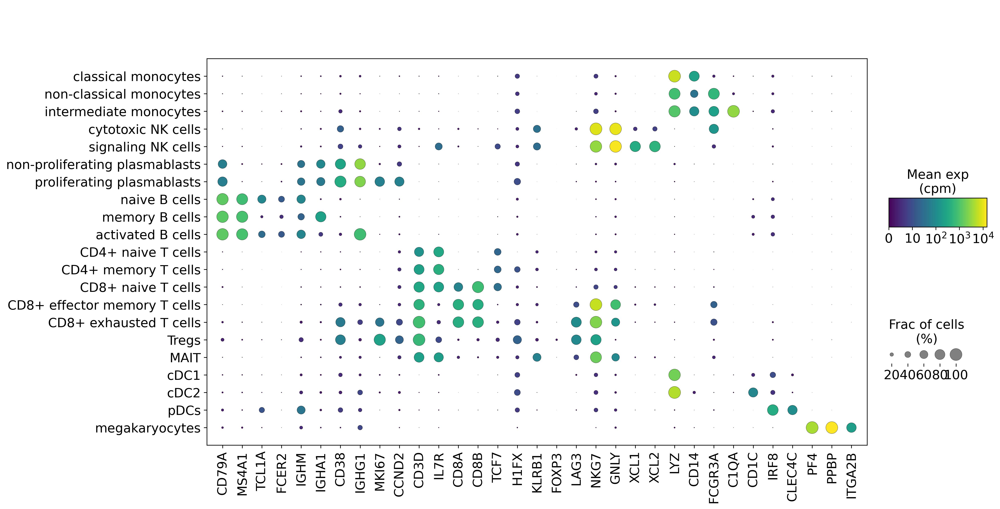

In [20]:
#Figure 1B, biomarkers for the cell subtypes

marker_genes = ['CD79A', 'MS4A1', 'TCL1A', 'FCER2',
                'IGHM', 'IGHA1', 'CD38', 'IGHG1', 
                'MKI67', 'CCND2', 
#                 'CD3D', 'IL7R', 'CD8A', 'CD8B', 'GZMA', #'GZMK', 
                'CD3D', 'IL7R', 'CD8A', 'CD8B','TCF7', 'H1FX', 'KLRB1', 'FOXP3', 'LAG3', 
                'NKG7', 'GNLY', 'XCL1', 'XCL2',
                'LYZ', 'CD14', 'FCGR3A', 'C1QA',
                'CD1C', 'IRF8', 'CLEC4C', 
                'PF4', 'PPBP', 'ITGA2B']

dotplot(adata_kid, save_figures, marker_genes)

In [21]:
def umap_plot(adata, path, group, color_map, title, filetype=False, annotation=False, **kwargs):
    rcParams['figure.figsize']=(7,7)
    rcParams['font.size']= 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"
    
    temp = adata[(adata.obs[group] != 'unknown') & (adata.obs[group] != 'doublets')].copy()
    
    fig, ax = plt.subplots()
    if annotation == False:
        sc.pl.umap(temp, color=group, palette = color_map, ax=ax, show=False, title = title, size=20, **kwargs)
        ax.legend(markerscale = 3, fontsize = 16, bbox_to_anchor=(1, 1), frameon = False)
    elif annotation == True:
        temp.obs['umap'] = temp.obs[group]
        ct_rep = {'B cells': 'B',
                  'Plasmablasts': 'Plasmablasts',
                  'T cells': 'T',
                  'NK cells': 'NK',
                  'Monocytes': 'Monocytes',
                  'conventional DCs': 'cDCs',
                  'plasmacytoid DCs': 'pDCs',
                  'megakaryocytes': 'mega'}
        cst_rep = {cst: str(n + 1) for cst, n in zip(cell_subtypes, range(len(cell_subtypes)))}
        temp.obs['umap'].replace([ct_rep, cst_rep][group != 'cell_type_new'], inplace=True)
        
        reorder_list = [[ct_rep[ct] for ct in cell_types], [cst_rep[cst] for cst in cell_subtypes]]
        temp.obs.umap = temp.obs.umap.astype('category')
        temp.obs.umap.cat.reorder_categories(reorder_list[group != 'cell_type_new'], 
            inplace = True)

        sc.pl.umap(temp, color='umap', palette = color_map, ax=ax, show=False, title = title, size=20,
                   legend_loc='on data', legend_fontweight = 'bold', **kwargs)
        
    if filetype is not False:
        name = 'umap_' + group +'.' + filetype
        fig.savefig(os.path.join(path, name), bbox_inches='tight')
        
    return {'xlim': ax.get_xlim(), 'ylim': ax.get_ylim()}

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
<ipython-input-21-2f2eee5432b5>:29: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  temp.obs.umap.cat.reorder_categories(reorder_list[group != 'cell_type_new'],
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
<ipython-input-21-2f2eee5432b5>:29: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categori

{'xlim': (-7.40051794052124, 16.79354238510132),
 'ylim': (-7.894138050079346, 19.93760461807251)}

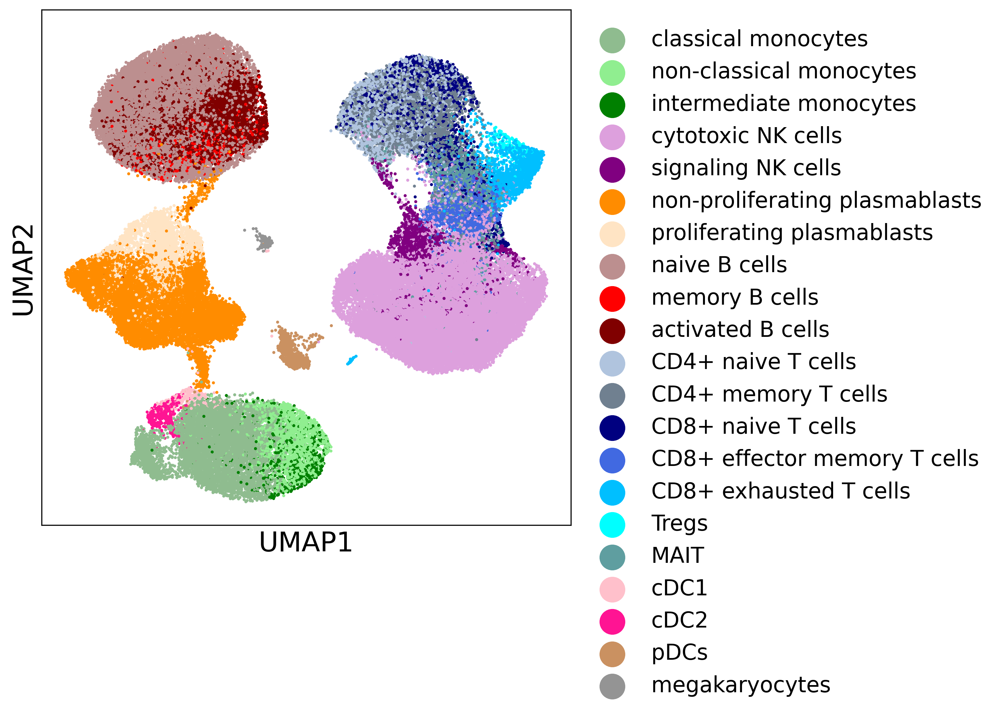

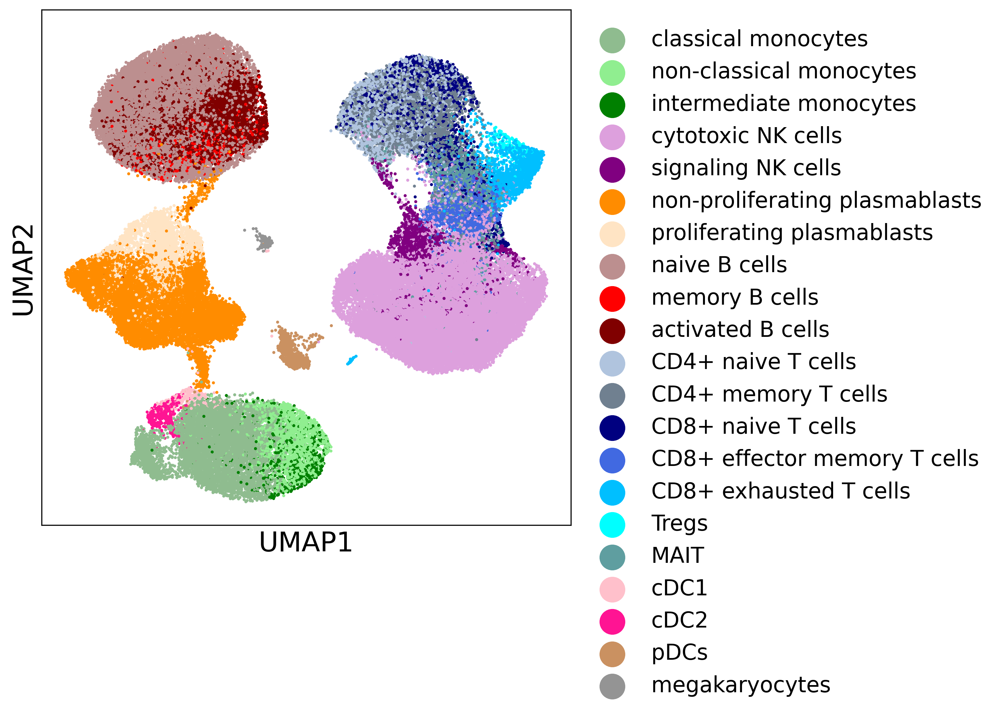

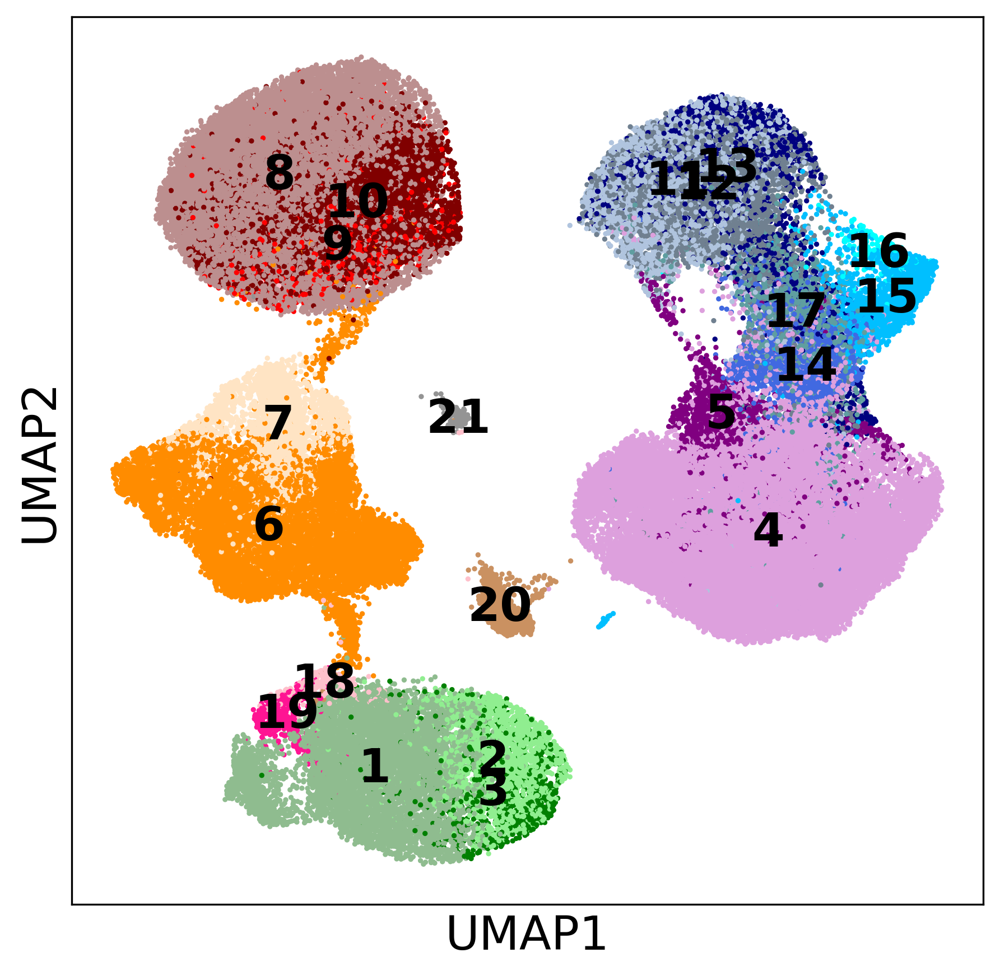

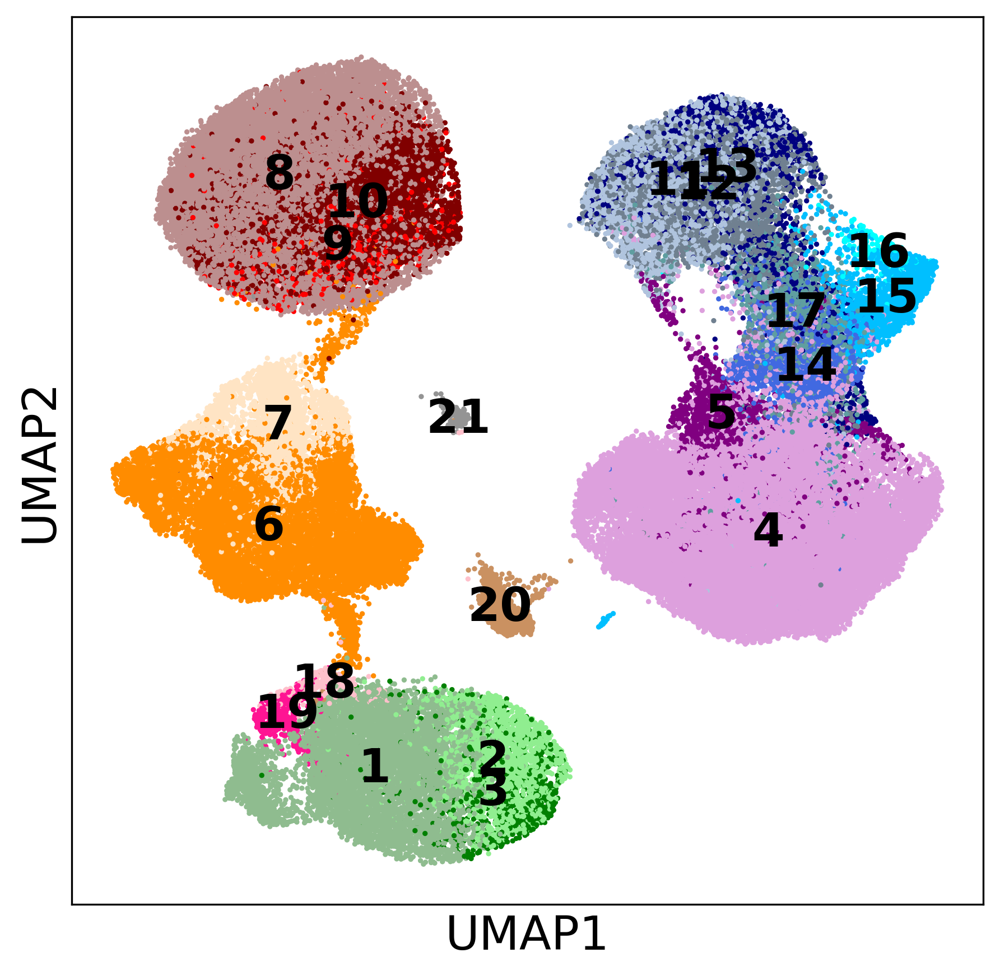

In [33]:
#Figure 1C, umap

cmap_ct = sns.color_palette([ct_palette[ct] for ct in cell_types])
umap_plot(adata_kid, save_figures, 'cell_type_new', cmap_ct, '', 'png')
umap_plot(adata_kid, save_figures, 'cell_type_new', cmap_ct, '', 'pdf')

umap_plot(adata_kid, save_figures, 'cell_type_new', cmap_ct, '', 'ant.png', annotation=True)
umap_plot(adata_kid, save_figures, 'cell_type_new', cmap_ct, '', 'ant.pdf', annotation=True)

cmap_cst = sns.color_palette([cst_palette[cst] for cst in cell_subtypes])
lims = umap_plot(adata_kid, save_figures, 'cell_subtype_new', cmap_cst, '', 'png')
umap_plot(adata_kid, save_figures, 'cell_subtype_new', cmap_cst, '', 'pdf')

lims = umap_plot(adata_kid, save_figures, 'cell_subtype_new', cmap_cst, '', 'ant.png', annotation=True)
umap_plot(adata_kid, save_figures, 'cell_subtype_new', cmap_cst, '', 'ant.pdf', annotation=True)

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.re

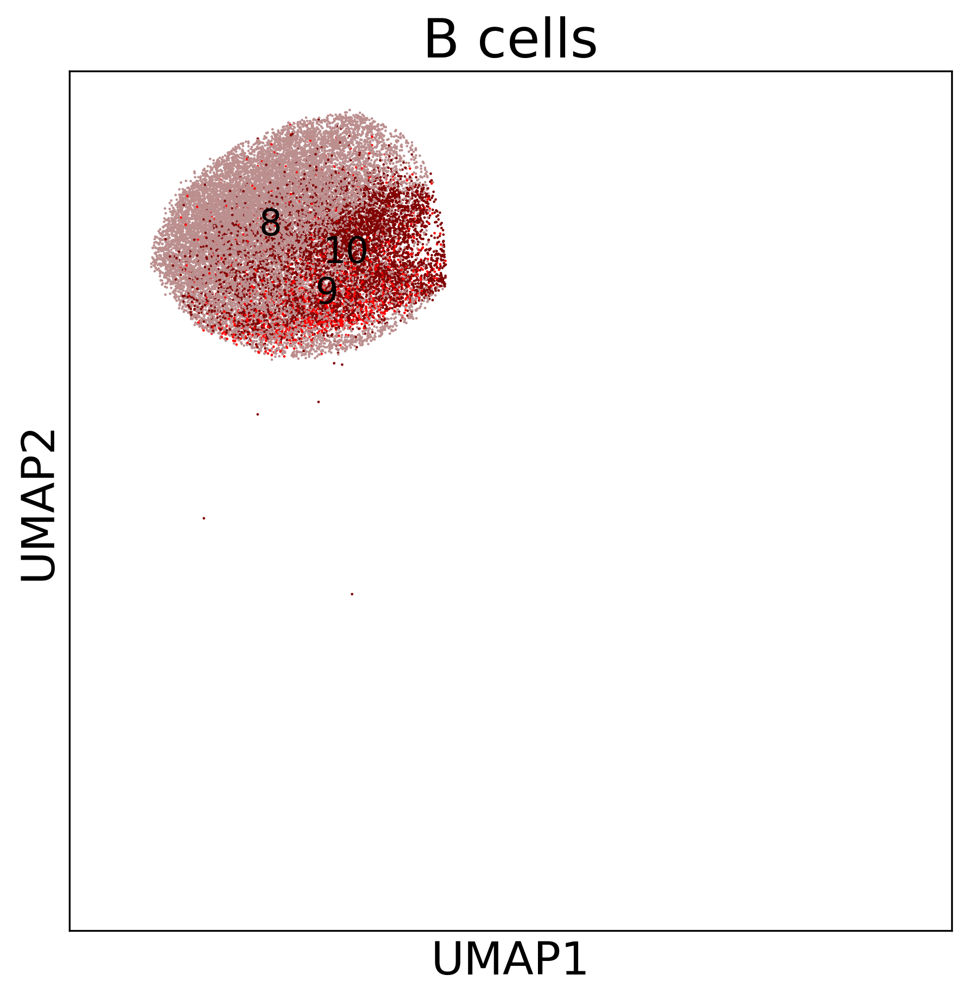

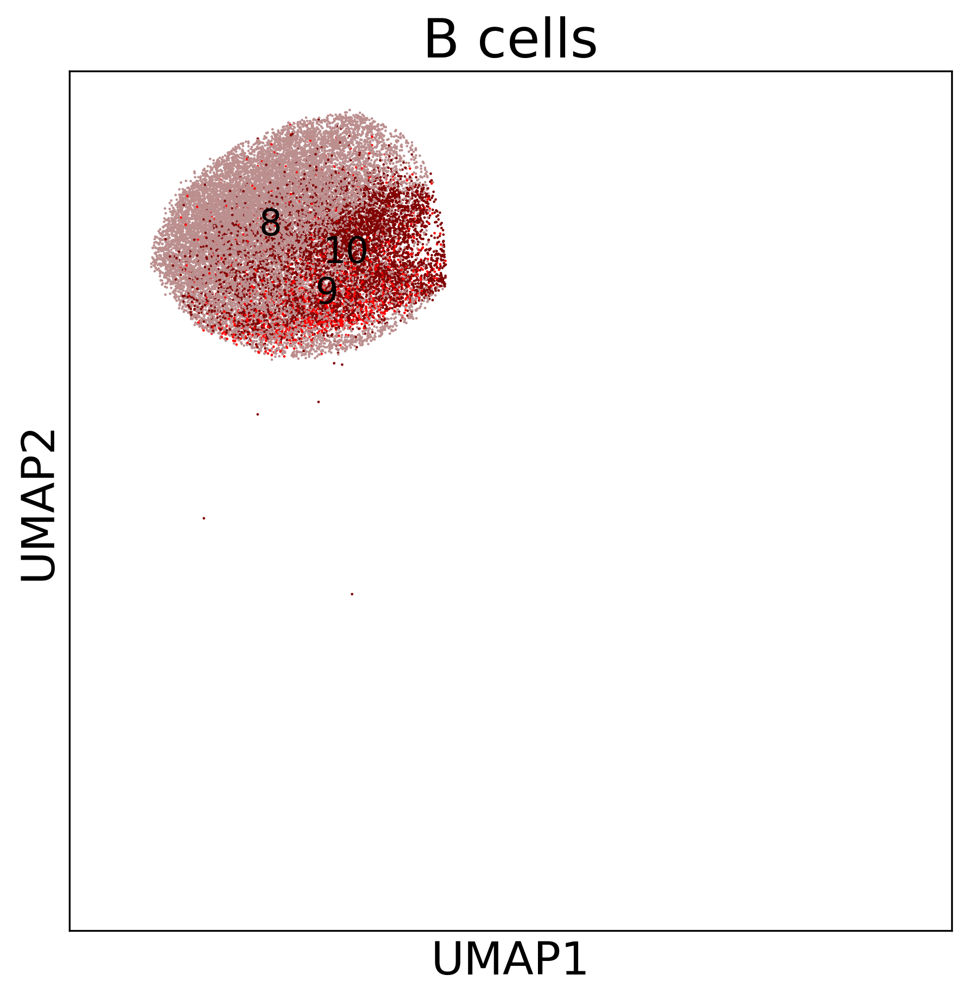

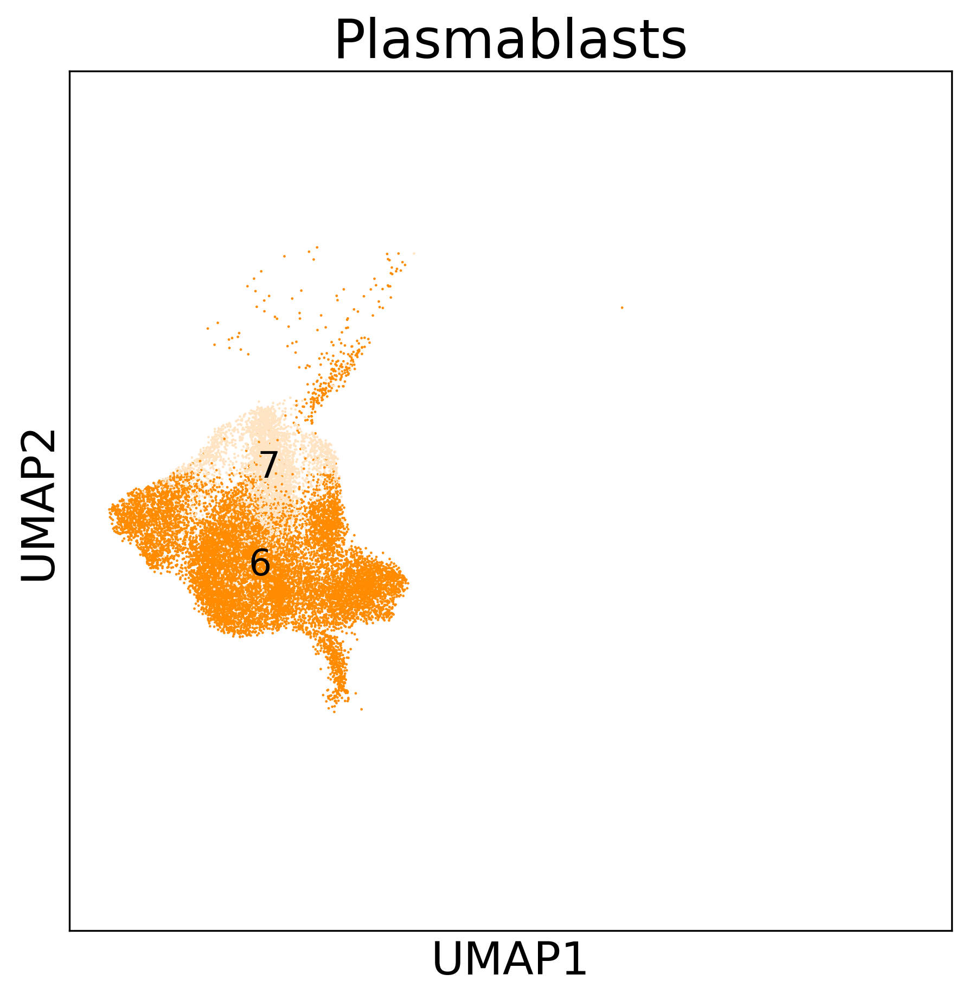

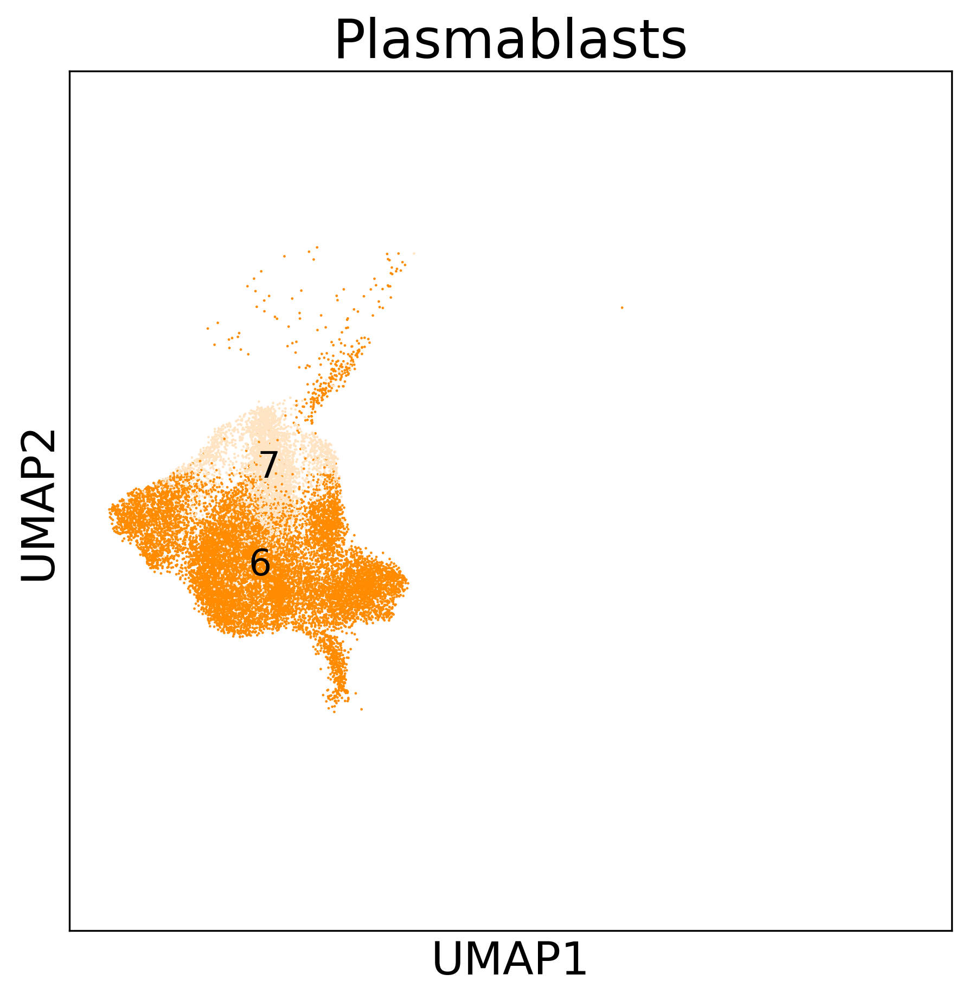

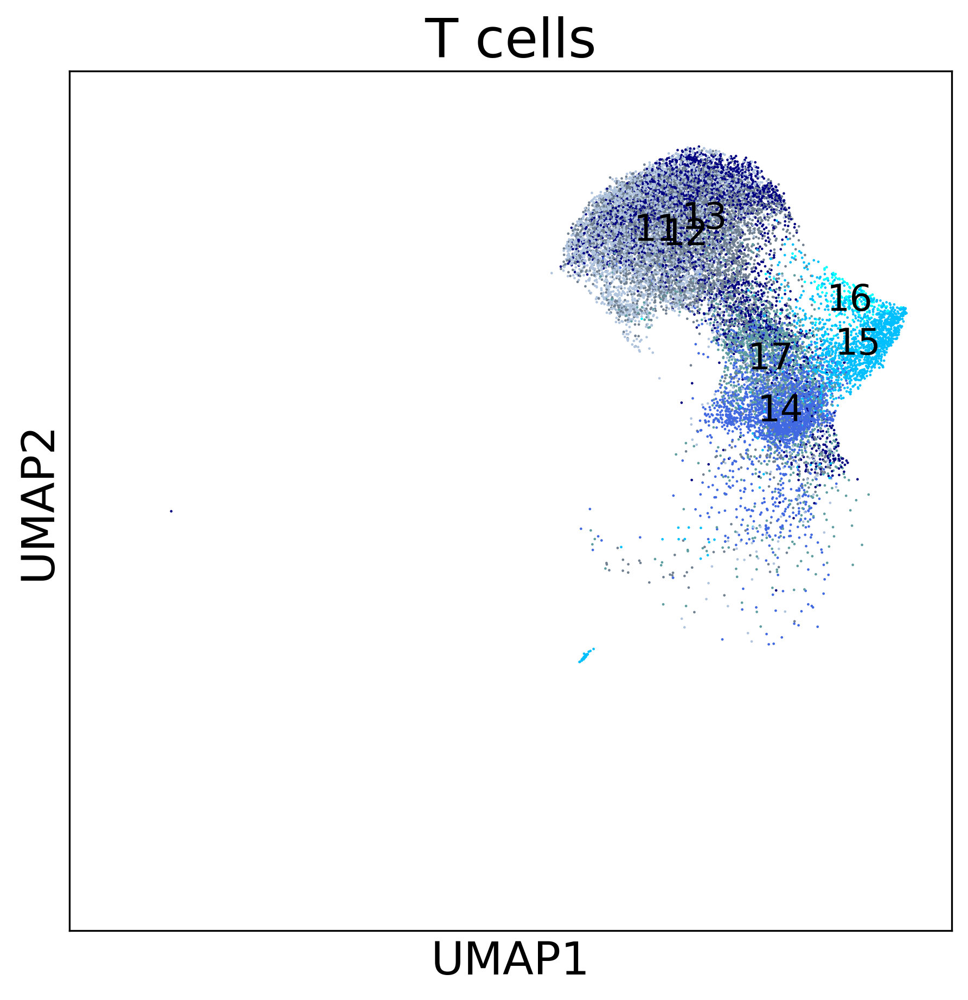

...

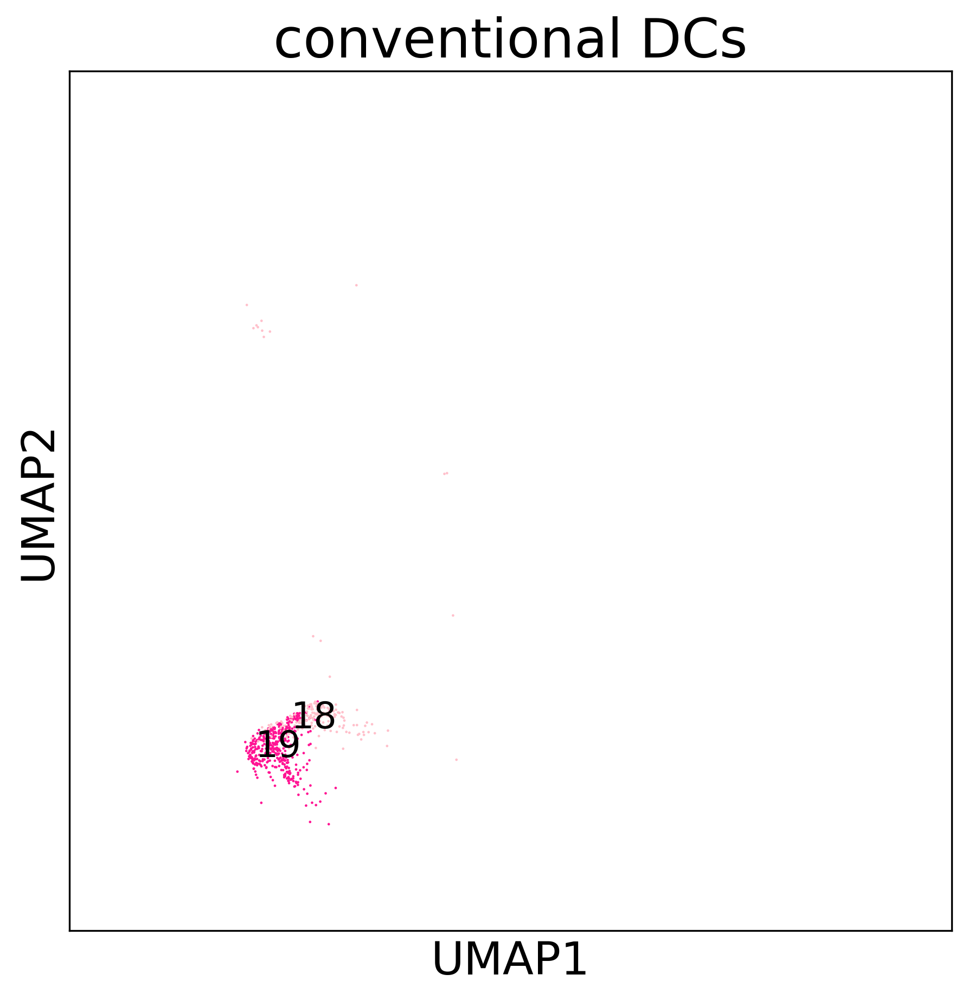

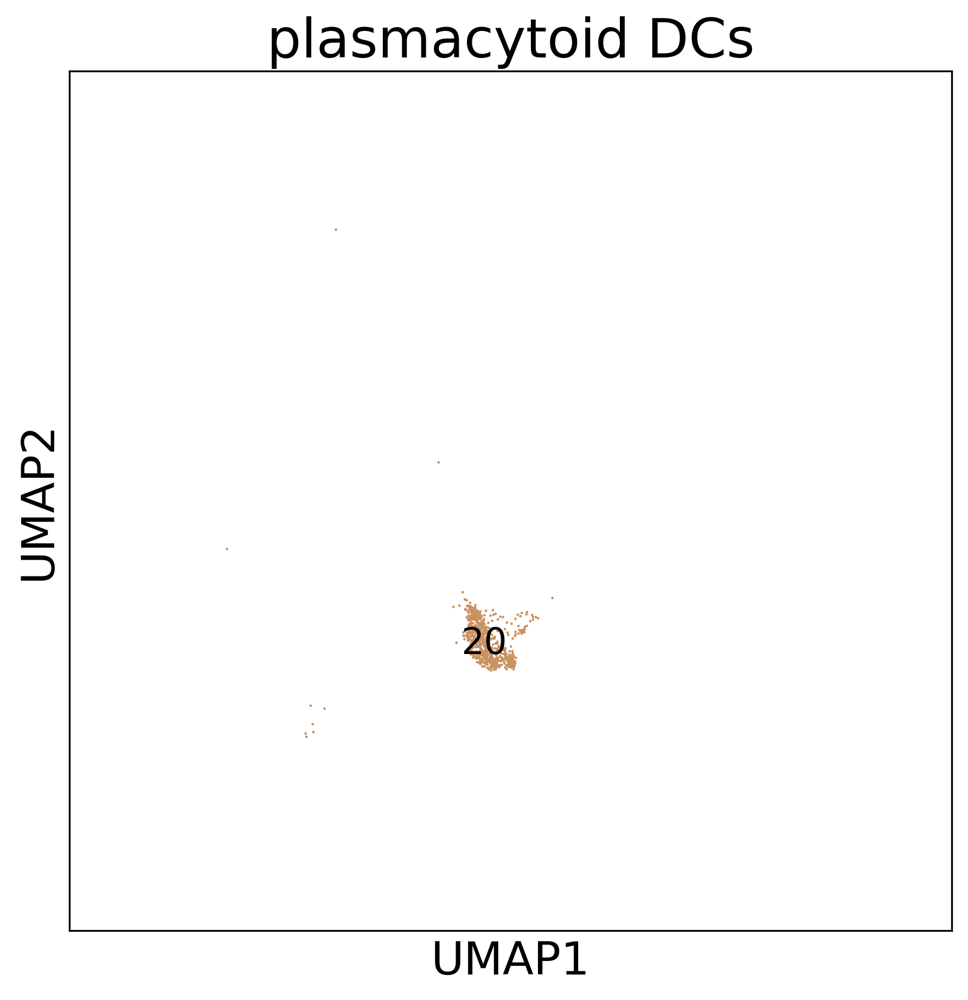

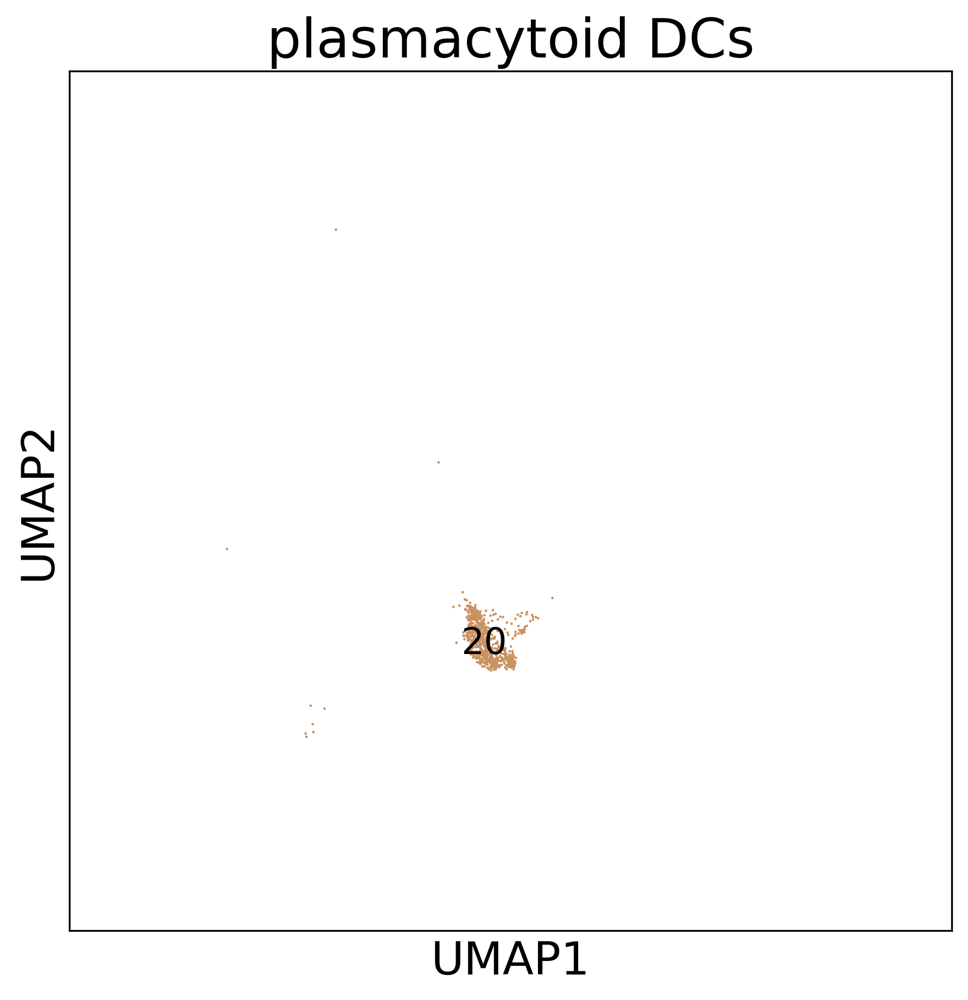

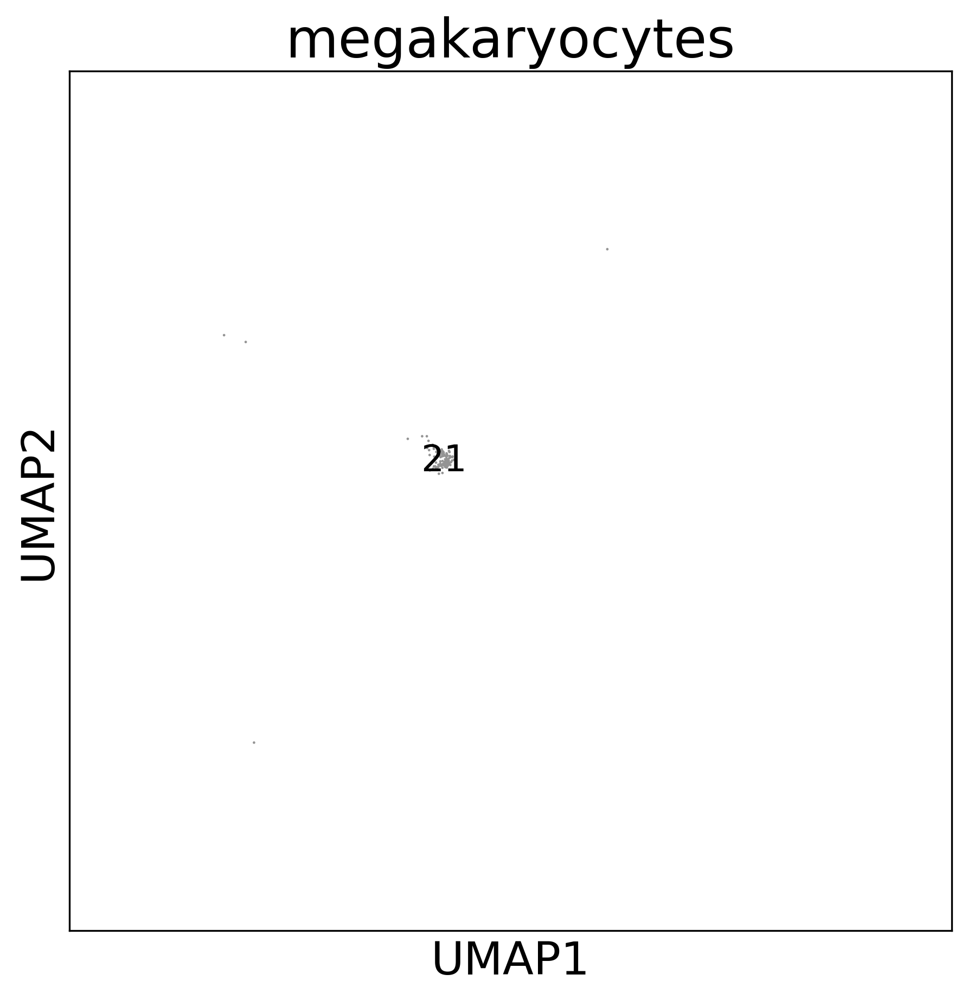

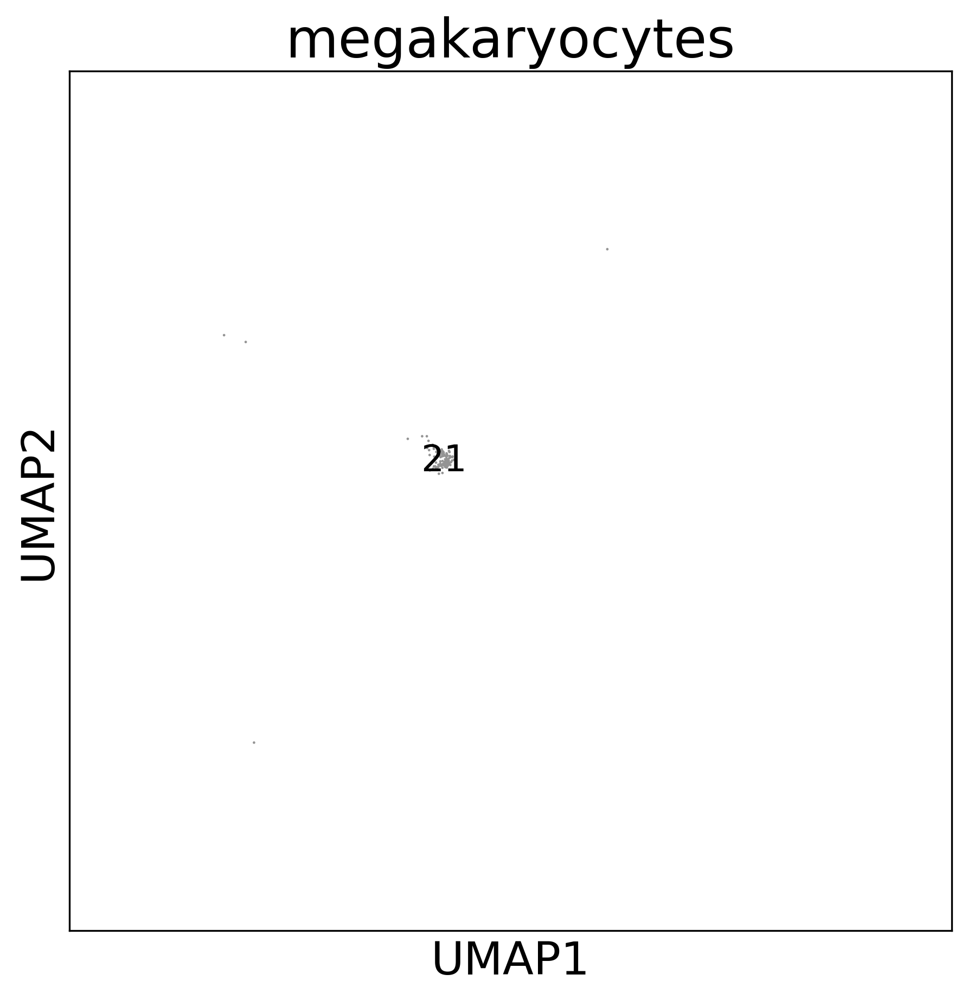

In [34]:
for ct in cell_types:
    adata_ct = adata_kid[adata_kid.obs['cell_type_new'] == ct]
    csts = adata_ct.obs['cell_subtype_new'].cat.categories
    cmap = sns.color_palette([cst_palette[cst] for cst in csts])
    umap_plot_2(adata_ct, save_figures, 'cell_subtype_new', cmap, ct, lims['xlim'], lims['ylim'], filetype='ant.png')
    umap_plot_2(adata_ct, save_figures, 'cell_subtype_new', cmap, ct, lims['xlim'], lims['ylim'], filetype='ant.pdf')

/usr/lib/python3.9/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.obs` of view, copying.
... storing 'virus' as categorical
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


{'xlim': (-6.653696966171265, 16.727302503585815),
 'ylim': (-7.566534638404846, 19.371307492256165)}

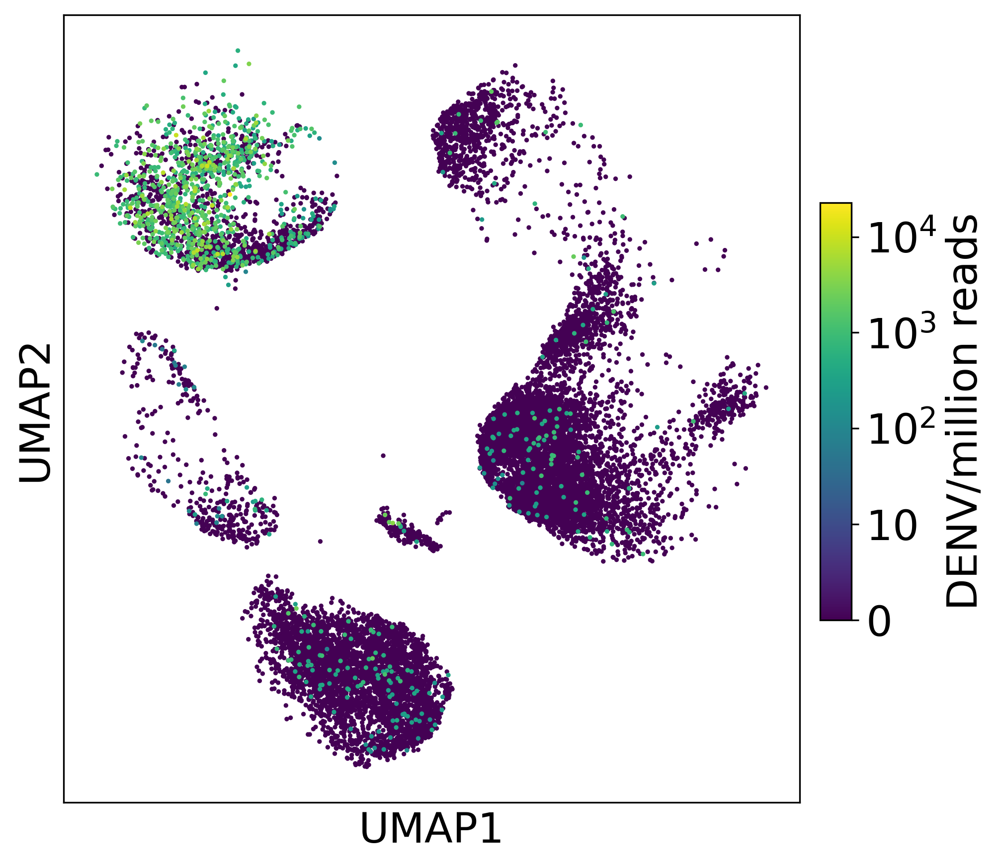

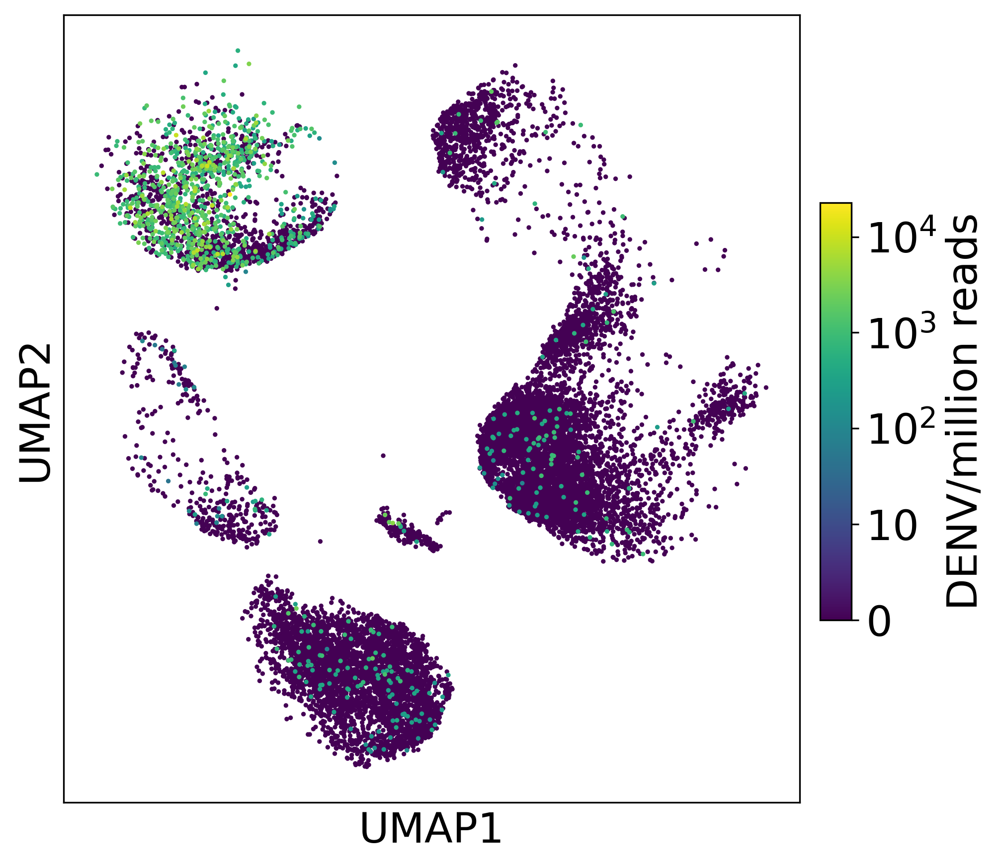

In [16]:
#select 3 DWS patients and plot umap for Figure 2A 

#normalize the virue reads
virus_nor(adata_kid)

#select 3 DWS patients
data_kid_3DWS = adata_kid[(adata_kid.obs.ID == '5_089_01') | 
                         (adata_kid.obs.ID == '6_020_01') |
                         (adata_kid.obs.ID == '6_025_01')].copy()

#plotting

umap_virus(data_kid_3DWS, '/home/yike/phd/dengue/docs/paper_draft/figures/figure_2/', 'DENV_reads_nor', 'png')
umap_virus(data_kid_3DWS, '/home/yike/phd/dengue/docs/paper_draft/figures/figure_2/', 'DENV_reads_nor', 'pdf')

In [23]:
def umap_cst(adata, path, group, color_map, title, filetype=False):
    rcParams['figure.figsize']=(7,7)
    rcParams['font.size']= 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"

    temp = adata[(adata.obs[group] != 'unknown') & (adata.obs[group] != 'doublets')].copy()
    temp.obs['umap'] = temp.obs[group]
    cst_rep = {cst: str(n + 1) for cst, n in zip(cell_subtypes, range(len(cell_subtypes)))}
    temp.obs['umap'].replace(cst_rep, inplace=True)
        
    fig, ax = plt.subplots()
    sc.pl.umap(temp, color=group, palette = color_map, ax=ax, show=False, title = title, size=20)
    ax.legend(markerscale = 3, fontsize = 16, bbox_to_anchor=(1, 1), frameon = False)
#     ax.set_xlim(xlim)
#     ax.set_ylim(ylim)
    
    if filetype is not False:
        name = 'umap_' + group + '_' + title + '.' + filetype
        fig.savefig(os.path.join(path, name), bbox_inches='tight')

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
Trying to set attribute `.uns` of view, copying.
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic f

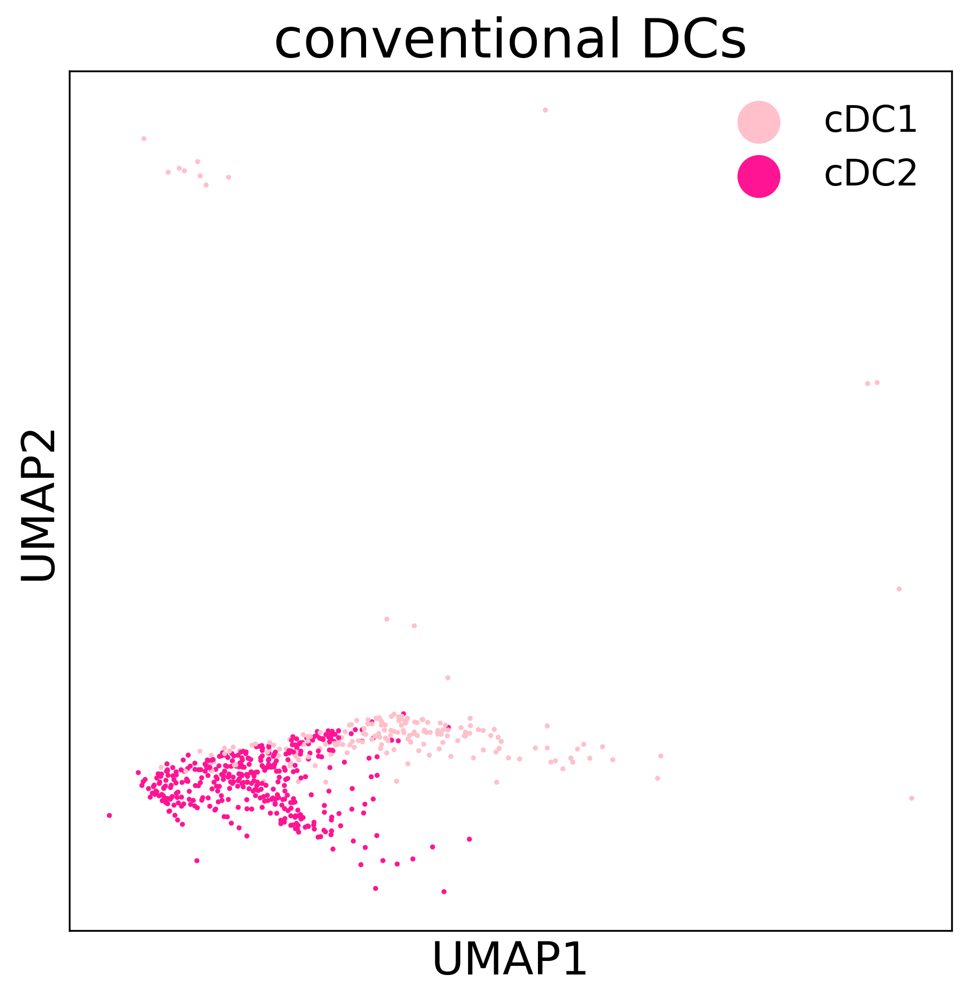

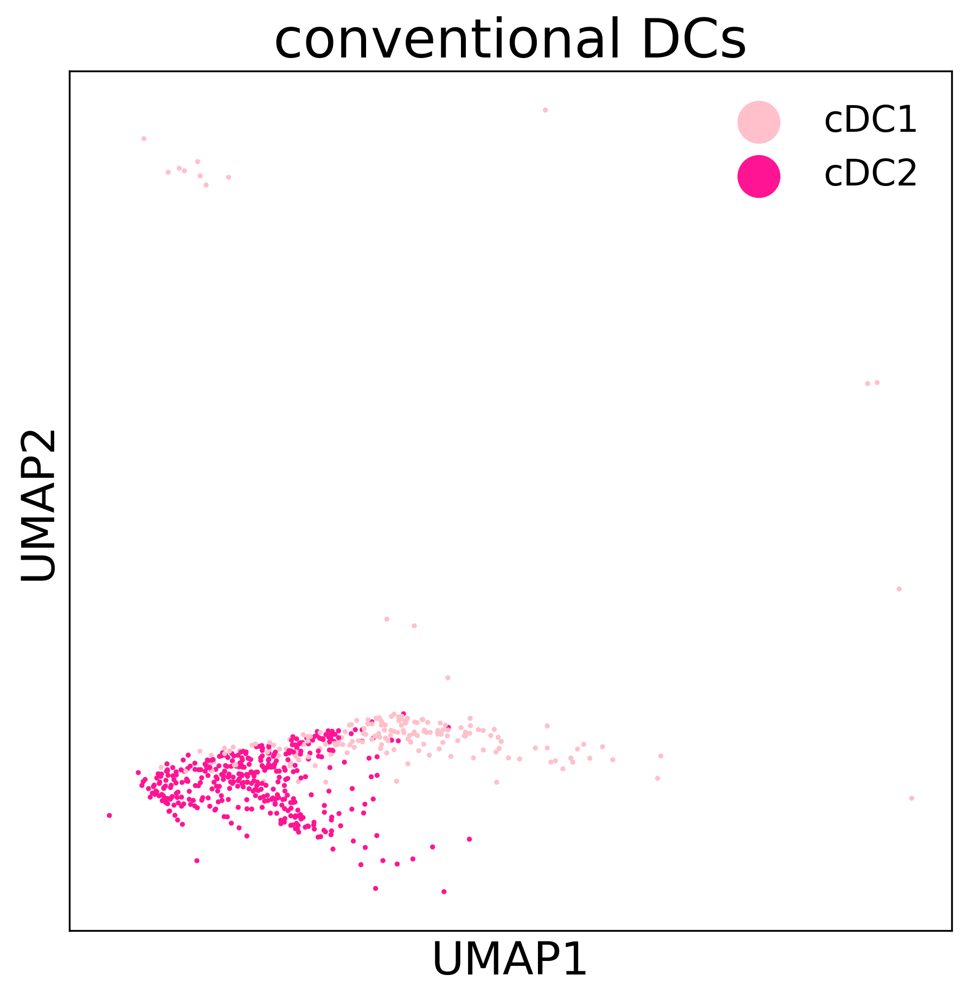

In [27]:
for ct in ['Monocytes', 'Plasmablasts', 'T cells', 'B cells', 'NK cells']:
    adata_ct = adata_kid[adata_kid.obs['cell_type_new'] == ct]
    cluster(adata_ct)
#     sc.pp.highly_variable_genes(adata_ct, n_top_genes=2000) # for 'conventional DCs'
#     sc.pp.pca(adata_ct, n_comps=40, use_highly_variable=True, svd_solver='arpack')
#     sc.pp.neighbors(adata_ct, n_pcs = 15)
    csts = adata_ct.obs['cell_subtype_new'].cat.categories
    cmap = sns.color_palette([cst_palette[cst] for cst in csts])
    umap_cst(adata_ct, save_figures, 'cell_subtype_new', cmap, ct, filetype='ant.png')
    umap_cst(adata_ct, save_figures, 'cell_subtype_new', cmap, ct, filetype='ant.pdf')

In [14]:
def umap_plot_gray(adata, ct):
    rcParams['figure.figsize']=(7,7)
    rcParams['font.size']= 20
    rcParams['pdf.fonttype'] = 42
    rcParams['figure.dpi'] = 300
    rcParams['font.sans-serif'] = "Arial"
    
    temp = adata[(adata.obs['cell_type_new'] != 'unknown') & (adata.obs['cell_type_new'] != 'doublets')].copy()
    
    fig, ax = plt.subplots()
#     if annotation == False:
    csts = temp[temp.obs['cell_type_new'] == ct].obs['cell_subtype_new'].unique().tolist()
    
    temp.obs['umap'] = 'Other cells'
    
    for cst in csts:
        temp.obs.loc[temp.obs['cell_subtype_new'] == cst, 'umap'] = cst
        
    temp.obs.umap = temp.obs.umap.astype('category')
    reorder_list = ['Other cells'] + csts
    temp.obs.umap.cat.reorder_categories(reorder_list, inplace = True)
    color_map = ['gray'] + [cst_palette[cst] for cst in csts]
    sc.pl.umap(temp, color='umap', palette = color_map, ax=ax, show=False, title = ct, size=20)
    ax.legend(markerscale = 3, fontsize = 16, bbox_to_anchor=(1, 1), frameon = False)

    return {'figure': fig, 'ax': ax}

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
<ipython-input-25-3544179f0be1>:21: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  temp.obs.umap.cat.reorder_categories(reorder_list, inplace = True)


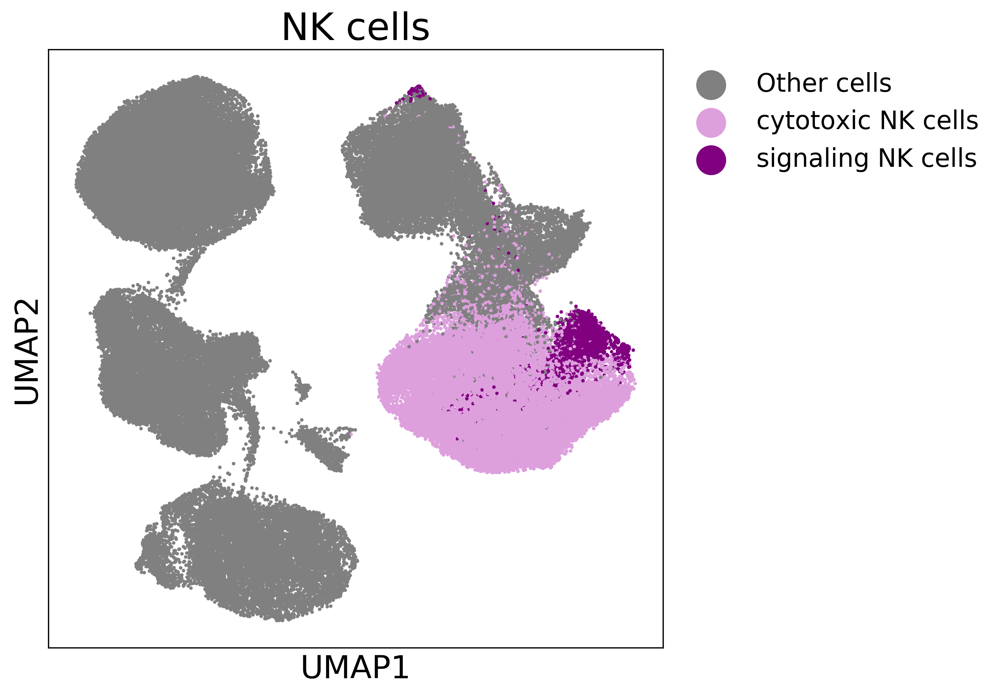

In [31]:
img = umap_plot_gray(adata_kid, 'NK cells',)
img['figure'].savefig(save_figures + 'NK_gray.png', bbox_inches='tight')

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
<ipython-input-25-3544179f0be1>:21: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  temp.obs.umap.cat.reorder_categories(reorder_list, inplace = True)


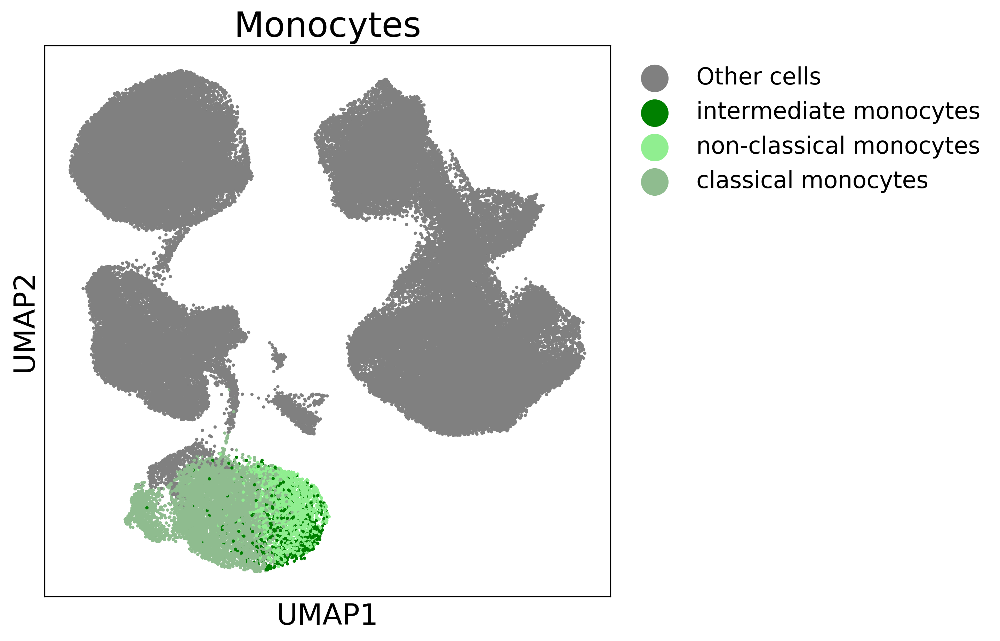

In [32]:
img = umap_plot_gray(adata_kid, 'Monocytes',)
img['figure'].savefig(save_figures + 'Momo_gray.png', bbox_inches='tight')

/home/yike/.conda/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1095: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  df_sub[k].cat.remove_unused_categories(inplace=True)
<ipython-input-14-3544179f0be1>:21: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  temp.obs.umap.cat.reorder_categories(reorder_list, inplace = True)
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


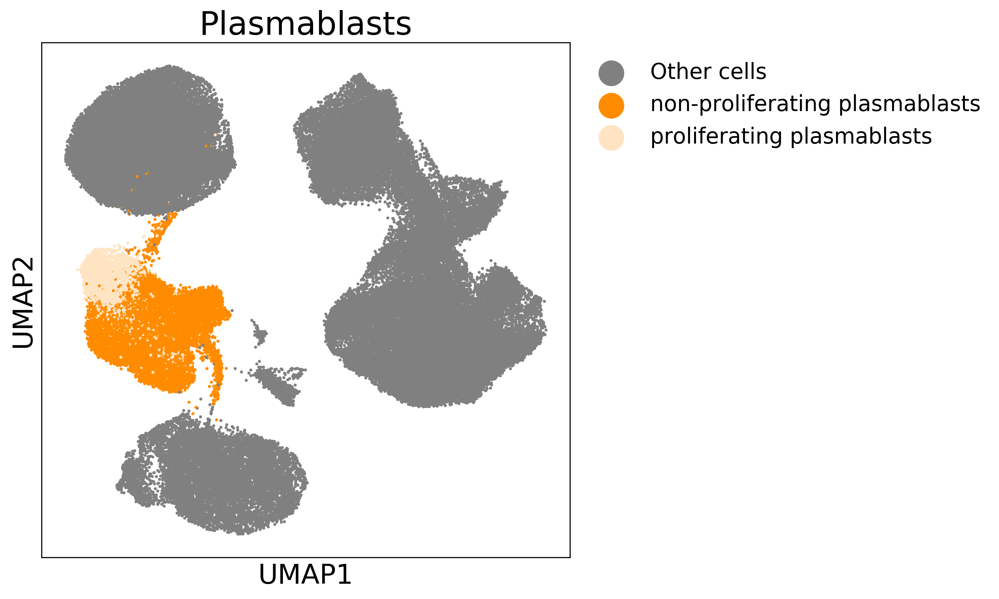

In [15]:
img = umap_plot_gray(adata_kid, 'Plasmablasts',)
img['figure'].savefig(save_figures + 'PB_gray.png', bbox_inches='tight')